In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [2]:
df = pd.read_csv("Students_Grading_Dataset.csv")

In [3]:
df.head()

,Student_ID,First_Name,Last_Name,Email,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,S1000,Omar,Williams,student0@university.com,Female,22,Engineering,52.29,55.03,57.82,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,S1001,Maria,Brown,student1@university.com,Male,18,Engineering,97.27,97.23,45.80,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,S1002,Ahmed,Jones,student2@university.com,Male,24,Business,57.19,67.05,93.68,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,S1003,Omar,Williams,student3@university.com,Female,24,Mathematics,95.15,47.79,80.63,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,S1004,John,Smith,student4@university.com,Female,23,CS,54.18,46.59,78.89,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1


In [4]:
df.shape

(5000, 23)

In [5]:
df.columns

Index(['Student_ID', 'First_Name', 'Last_Name', 'Email', 'Gender', 'Age',
       'Department', 'Attendance (%)', 'Midterm_Score', 'Final_Score',
       'Assignments_Avg', 'Quizzes_Avg', 'Participation_Score',
       'Projects_Score', 'Total_Score', 'Grade', 'Study_Hours_per_Week',
       'Extracurricular_Activities', 'Internet_Access_at_Home',
       'Parent_Education_Level', 'Family_Income_Level', 'Stress_Level (1-10)',
       'Sleep_Hours_per_Night'],
      dtype='object')

In [6]:
df.dtypes

Student_ID                     object
First_Name                     object
Last_Name                      object
Email                          object
Gender                         object
Age                             int64
Department                     object
Attendance (%)                float64
Midterm_Score                 float64
Final_Score                   float64
Assignments_Avg               float64
Quizzes_Avg                   float64
Participation_Score           float64
Projects_Score                float64
Total_Score                   float64
Grade                          object
Study_Hours_per_Week          float64
Extracurricular_Activities     object
Internet_Access_at_Home        object
Parent_Education_Level         object
Family_Income_Level            object
Stress_Level (1-10)             int64
Sleep_Hours_per_Night         float64
dtype: object

In [7]:
for col in df.select_dtypes(include=['object']).columns:
    print(col, ":", df[col].nunique())


Student_ID : 5000
First_Name : 8
Last_Name : 6
Email : 5000
Gender : 2
Department : 4
Grade : 5
Extracurricular_Activities : 2
Internet_Access_at_Home : 2
Parent_Education_Level : 4
Family_Income_Level : 3


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Student_ID                  5000 non-null   object 
 1   First_Name                  5000 non-null   object 
 2   Last_Name                   5000 non-null   object 
 3   Email                       5000 non-null   object 
 4   Gender                      5000 non-null   object 
 5   Age                         5000 non-null   int64  
 6   Department                  5000 non-null   object 
 7   Attendance (%)              4484 non-null   float64
 8   Midterm_Score               5000 non-null   float64
 9   Final_Score                 5000 non-null   float64
 10  Assignments_Avg             4483 non-null   float64
 11  Quizzes_Avg                 5000 non-null   float64
 12  Participation_Score         5000 non-null   float64
 13  Projects_Score              5000 

In [9]:
df.describe()

,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,Total_Score,Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night
count,5000.000000,4484.000000,5000.000000,5000.000000,4483.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,21.048400,75.431409,70.326844,69.640788,74.798673,74.910728,4.980024,74.924860,75.121804,17.658860,5.48080,6.488140
std,1.989786,14.372446,17.213209,17.238744,14.411799,14.504281,2.890136,14.423415,14.399941,7.275864,2.86155,1.452283
min,18.000000,50.010000,40.000000,40.000000,50.000000,50.030000,0.000000,50.010000,50.020000,5.000000,1.00000,4.000000
25%,19.000000,63.265000,55.457500,54.667500,62.090000,62.490000,2.440000,62.320000,62.835000,11.400000,3.00000,5.200000
50%,21.000000,75.725000,70.510000,69.735000,74.810000,74.695000,4.955000,74.980000,75.395000,17.500000,5.00000,6.500000
75%,23.000000,87.472500,84.970000,84.500000,86.970000,87.630000,7.500000,87.367500,87.652500,24.100000,8.00000,7.700000
max,24.000000,100.000000,99.980000,99.980000,99.980000,99.960000,10.000000,100.000000,99.990000,30.000000,10.00000,9.000000


In [10]:
df.describe(include='object')

,Student_ID,First_Name,Last_Name,Email,Gender,Department,Grade,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level
count,5000,5000,5000,5000,5000,5000,5000,5000,5000,3206,5000
unique,5000,8,6,5000,2,4,5,2,2,4,3
top,S5999,Maria,Johnson,student4999@university.com,Male,CS,A,No,Yes,PhD,Low
freq,1,657,868,1,2551,2022,1495,3493,4485,820,1983


In [11]:
df.duplicated().sum()

np.int64(0)

In [12]:
df = df.drop_duplicates()

In [13]:
for col in df.columns:
    print(f"Column '{col}': {df[col].duplicated().sum()} duplicates")


Column 'Student_ID': 0 duplicates
Column 'First_Name': 4992 duplicates
Column 'Last_Name': 4994 duplicates
Column 'Email': 0 duplicates
Column 'Gender': 4998 duplicates
Column 'Age': 4993 duplicates
Column 'Department': 4996 duplicates
Column 'Attendance (%)': 2019 duplicates
Column 'Midterm_Score': 1591 duplicates
Column 'Final_Score': 1629 duplicates
Column 'Assignments_Avg': 2006 duplicates
Column 'Quizzes_Avg': 1827 duplicates
Column 'Participation_Score': 4003 duplicates
Column 'Projects_Score': 1859 duplicates
Column 'Total_Score': 1829 duplicates
Column 'Grade': 4995 duplicates
Column 'Study_Hours_per_Week': 4749 duplicates
Column 'Extracurricular_Activities': 4998 duplicates
Column 'Internet_Access_at_Home': 4998 duplicates
Column 'Parent_Education_Level': 4995 duplicates
Column 'Family_Income_Level': 4997 duplicates
Column 'Stress_Level (1-10)': 4990 duplicates
Column 'Sleep_Hours_per_Night': 4949 duplicates


In [14]:
df.duplicated(subset=['First_Name', 'Last_Name', 'Total_Score', 'Grade']).sum()


np.int64(16)

In [15]:
df = df.drop_duplicates(subset=['First_Name', 'Last_Name', 'Total_Score', 'Grade'])


In [16]:
df.duplicated(subset=['First_Name', 'Last_Name', 'Total_Score', 'Grade']).sum()


np.int64(0)

In [17]:
df.isnull().sum()

Student_ID                       0
First_Name                       0
Last_Name                        0
Email                            0
Gender                           0
Age                              0
Department                       0
Attendance (%)                 516
Midterm_Score                    0
Final_Score                      0
Assignments_Avg                516
Quizzes_Avg                      0
Participation_Score              0
Projects_Score                   0
Total_Score                      0
Grade                            0
Study_Hours_per_Week             0
Extracurricular_Activities       0
Internet_Access_at_Home          0
Parent_Education_Level        1789
Family_Income_Level              0
Stress_Level (1-10)              0
Sleep_Hours_per_Night            0
dtype: int64

In [18]:
for col in df.columns:
    nulls = df[col].isnull().sum() 
    if nulls > 0:
        print(col  ,  nulls , df[col].dtype )

Attendance (%) 516 float64
Assignments_Avg 516 float64
Parent_Education_Level 1789 object


In [19]:
df.drop(columns=['Parent_Education_Level'],inplace=True)

for col in ['Attendance (%)' , 'Assignments_Avg']:
    skew = df[col].skew()
    if abs(skew) > 1 :
        df[col].fillna(df[col].median() , inplace=True)
        print(col , "Filled with : median ")
    else:
        df[col].fillna(df[col].mean() , inplace=True)
        print(col , "Filled with : mean ")


Attendance (%) Filled with : mean 
Assignments_Avg Filled with : mean 


C:\Users\Remo\AppData\Local\Temp\ipykernel_19528\3388625534.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean() , inplace=True)


In [20]:
df.isnull().sum()


Student_ID                    0
First_Name                    0
Last_Name                     0
Email                         0
Gender                        0
Age                           0
Department                    0
Attendance (%)                0
Midterm_Score                 0
Final_Score                   0
Assignments_Avg               0
Quizzes_Avg                   0
Participation_Score           0
Projects_Score                0
Total_Score                   0
Grade                         0
Study_Hours_per_Week          0
Extracurricular_Activities    0
Internet_Access_at_Home       0
Family_Income_Level           0
Stress_Level (1-10)           0
Sleep_Hours_per_Night         0
dtype: int64

In [21]:
df.drop(columns=['Student_ID', 'First_Name', 'Last_Name', 'Email'], inplace=True)

In [22]:
label = LabelEncoder()
for col in df.select_dtypes(include=['object']):
    df[col] = label.fit_transform(df[col])
    print(col , "filled")

Gender filled
Department filled
Grade filled
Extracurricular_Activities filled
Internet_Access_at_Home filled
Family_Income_Level filled


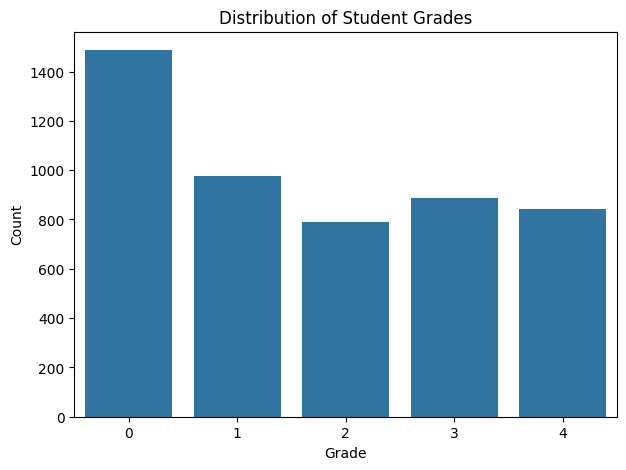

In [33]:
plt.figure(figsize=(7, 5))
sns.countplot(x=df['Grade'])
plt.title("Distribution of Student Grades")
plt.xlabel("Grade")
plt.ylabel("Count")
plt.show()

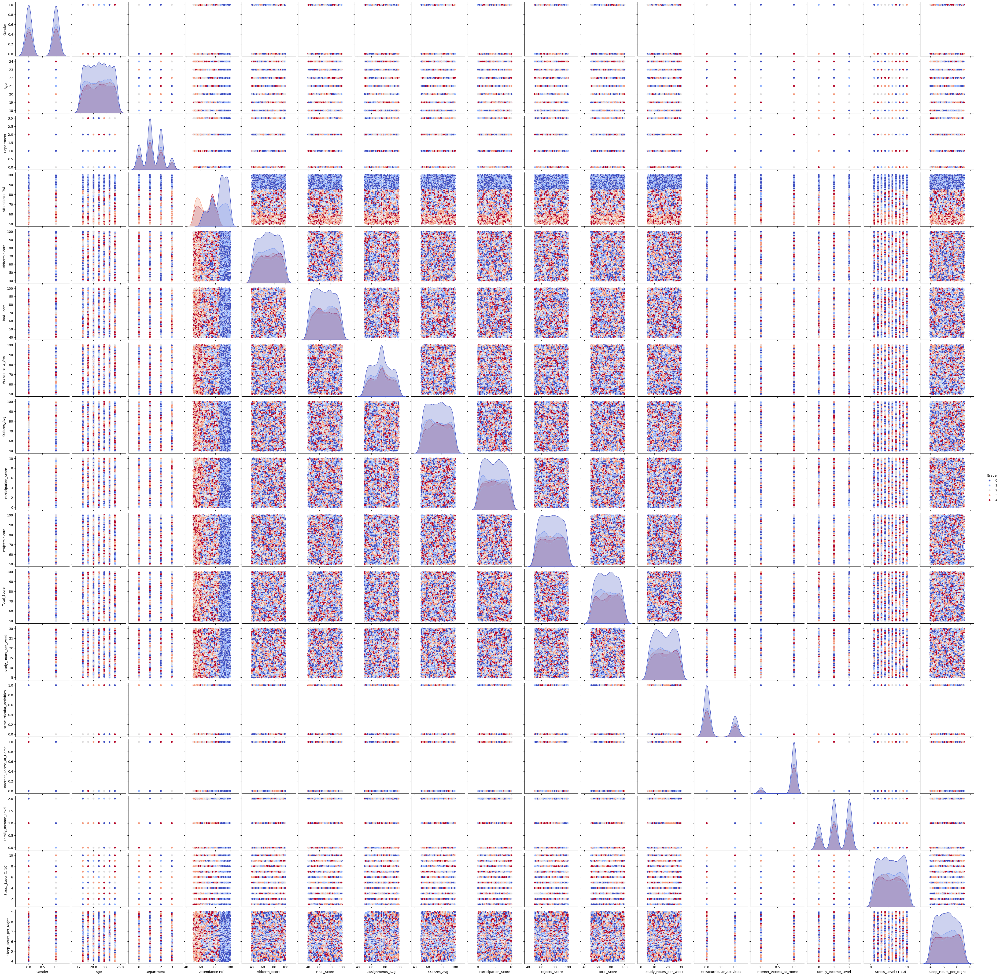

In [34]:
sns.pairplot(df, hue='Grade', diag_kind='kde', palette='coolwarm')
plt.show()


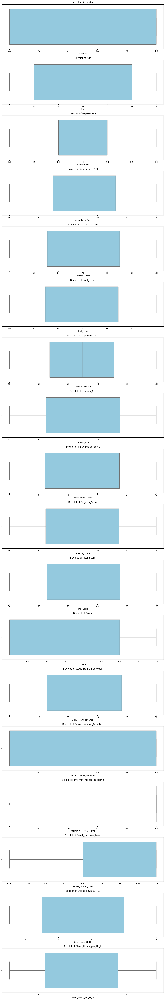

In [37]:
plt.figure(figsize=(12, len(df.columns) * 4))
for i, col in enumerate(df.columns, 1):
    plt.subplot(len(df.columns), 1, i)  
    sns.boxplot(x=df[col], color='skyblue')
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)

plt.tight_layout()  
plt.show()

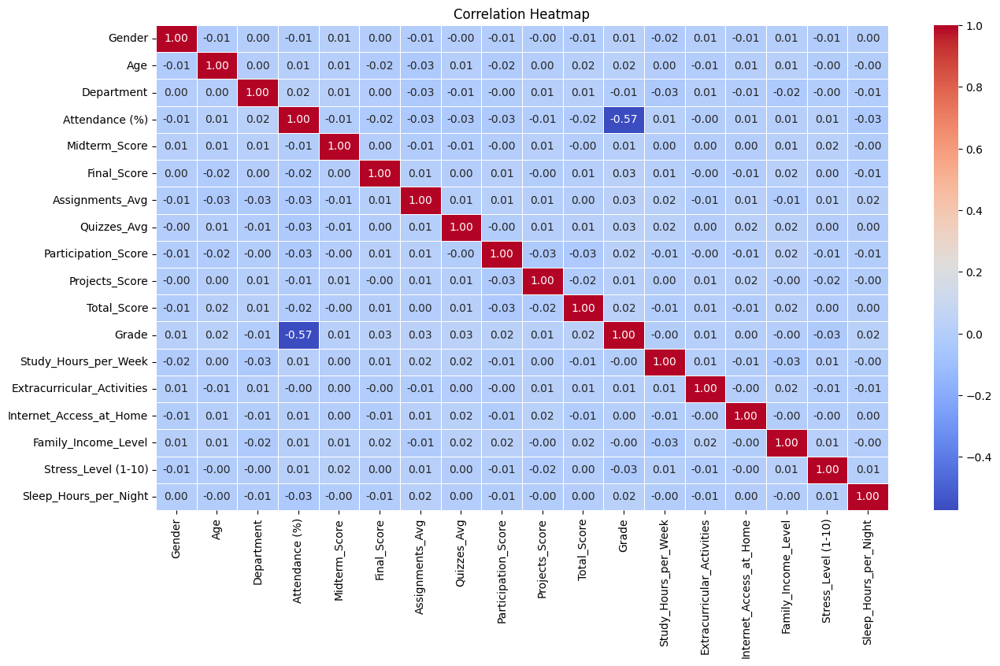

In [30]:
numeric_df = df.select_dtypes(include=['number'])  
correlation_matrix = numeric_df.corr()  

plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()